In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd

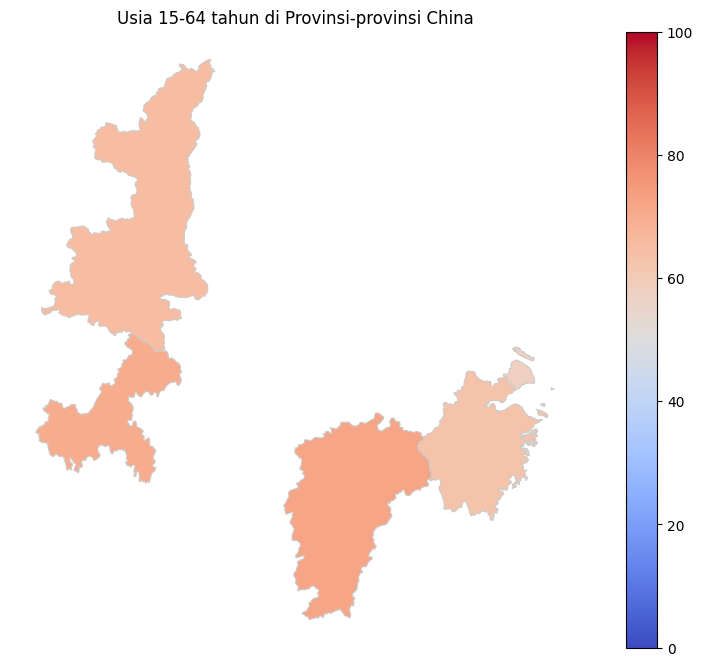

In [13]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Contoh data usia per provinsi di China
data = {
    'Province': ['Shaanxi Province', 'Shanghai Municipality', 'Chongqing Municipality', 'Zhejiang Province', 'Jiangxi Province'],
    'Age_0_14': [15, 12, 18, 14, 20],    # contoh usia 0-14 tahun
    'Age_15_64': [65, 58, 70, 63, 72],  # contoh usia 15-64 tahun
    'Age_65_plus': [20, 30, 12, 23, 8]  # contoh usia 65 tahun ke atas
}

df = pd.DataFrame(data)

# 3. Gabungkan data usia dengan data geospasial berdasarkan nama provinsi (ADM1_EN)
merged_data = china_map.set_index('ADM1_EN').join(df.set_index('Province'))

# 4. Buat plot peta choropleth
fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Atur batas warna (contoh saja, sesuaikan dengan data Anda)
cmap = 'coolwarm'
vmin, vmax = 0, 100  # sesuaikan dengan data usia yang Anda miliki

# Plot peta choropleth
merged_data.plot(column='Age_15_64', cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, vmin=vmin, vmax=vmax)

# Tambahkan judul dan label sumbu
ax.set_title('Usia 15-64 tahun di Provinsi-provinsi China')
ax.set_axis_off()

# Tampilkan plot
plt.show()


In [5]:
import geopandas as gpd

# Misalnya, peta geospasial provinsi-provinsi di China sudah ada dalam file shapefile
# Ganti dengan path file shapefile sesuai dengan yang Anda miliki
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Cetak nama-nama kolom yang ada dalam china_map
print(china_map.columns)

Index(['ADM1_EN', 'ADM1_ZH', 'ADM1_PCODE', 'ADM0_EN', 'ADM0_ZH', 'ADM0_PCODE',
       'geometry'],
      dtype='object')


In [11]:
import geopandas as gpd

# Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Print isi dari indeks kolom-kolom yang ada
print(china_map.columns)


Index(['ADM1_EN', 'ADM1_ZH', 'ADM1_PCODE', 'ADM0_EN', 'ADM0_ZH', 'ADM0_PCODE',
       'geometry'],
      dtype='object')


In [14]:
china_map['ADM1_EN']

0                            Shaanxi Province
1                       Shanghai Municipality
2                      Chongqing Municipality
3                           Zhejiang Province
4                            Jiangxi Province
5                             Yunnan Province
6                           Shandong Province
7                           Liaoning Province
8                     Tibet Autonomous Region
9                              Gansu province
10    Hong Kong Special Administrative Region
11                           Qinghai Province
12                       Beijing Municipality
13        Macao Special Administrative Region
14           Inner Mongolia Autonomous Region
15                             Hubei Province
16                             Anhui Province
17                           Guizhou Province
18              Ningxia Hui Autonomous Region
19                           Jiangsu Province
20           Xinjiang Uygur Autonomous Region
21                            Shan

In [18]:
import geopandas as gpd
import folium

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Menyaring data geospasial untuk hanya menampilkan wilayah China
# Misalnya, wilayah China memiliki kode ADM0_PCODE 'CN'
china_map_china_only = china_map[china_map['ADM0_PCODE'] == 'CN']

# 3. Buat peta interaktif dengan folium
m = folium.Map(location=[35, 105], zoom_start=4, tiles='cartodb positron')  # Tiles 'cartodb positron' untuk peta polos tanpa detail jalan

# Tambahkan geojson layer untuk wilayah China saja
folium.GeoJson(
    china_map_china_only,
    name='China Province Boundaries',
    style_function=lambda x: {'fillColor': 'orange', 'color': 'black', 'weight': 1, 'fillOpacity': 0.6}
).add_to(m)

# Tambahkan skala peta
folium.LayerControl().add_to(m)

# Tampilkan peta
m


In [23]:
import geopandas as gpd
import folium

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Fungsi untuk membuat peta interaktif dengan folium
def create_map(center=[35, 105], zoom_start=4):
    m = folium.Map(location=center, zoom_start=zoom_start, tiles='cartodb positron')  # Tiles 'cartodb positron' untuk peta polos tanpa detail jalan

    # Tambahkan geojson layer untuk semua provinsi di China
    folium.GeoJson(
        china_map,
        name='China Province Boundaries',
        style_function=lambda x: {'fillColor': 'orange', 'color': 'black', 'weight': 1, 'fillOpacity': 0.6}
    ).add_to(m)

    # Tambahkan skala peta
    folium.LayerControl().add_to(m)

    return m

# Fungsi untuk zoom ke provinsi tertentu (misalnya Shanghai)
def zoom_to_province(province_name):
    # Mereprojeksi geometri ke CRS Mercator (EPSG:3395)
    china_map_proj = china_map.to_crs('EPSG:3395')

    province = china_map_proj[china_map_proj['ADM1_EN'] == province_name]
    center = [province.geometry.centroid.y.values[0], province.geometry.centroid.x.values[0]]
    zoom_start = 8

    m = create_map(center=center, zoom_start=zoom_start)

    # Tambahkan markas untuk provinsi yang dipilih
    folium.Marker(location=center, popup=province_name, icon=folium.Icon(color='red')).add_to(m)

    return m

# Contoh penggunaan:
map_china = create_map()

# Tampilkan peta China default
map_china.save('china_map.html')

# Zoom ke Shanghai
map_shanghai = zoom_to_province('Shanghai Municipality')

# Tampilkan peta Shanghai
map_shanghai.save('shanghai_map.html')


In [29]:
import geopandas as gpd
import pandas as pd
import folium

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Contoh data usia per provinsi di China
data = {
    'Province': ['Shaanxi Province', 'Shanghai Municipality', 'Chongqing Municipality', 'Zhejiang Province', 'Jiangxi Province'],
    'Age_0_14': [15, 12, 18, 14, 20],    # contoh usia 0-14 tahun
    'Age_15_64': [65, 58, 70, 63, 72],  # contoh usia 15-64 tahun
    'Age_65_plus': [20, 30, 12, 23, 8]  # contoh usia 65 tahun ke atas
}

df = pd.DataFrame(data)

# 3. Gabungkan data usia dengan data geospasial berdasarkan nama provinsi (ADM1_EN)
merged_data = china_map.set_index('ADM1_EN').join(df.set_index('Province'))

# Mengisi nilai None dengan 0
merged_data['Age_15_64'] = merged_data['Age_15_64'].fillna(0)

# Tambahkan kolom ADM1_EN ke merged_data
merged_data = merged_data.reset_index()

# Fungsi untuk menentukan warna berdasarkan jumlah usia 15-64
def get_fill_color(age_15_64):
    if age_15_64 < 50:
        return 'red'
    elif age_15_64 > 70:
        return 'green'
    else:
        return 'yellow'

# 4. Buat peta interaktif dengan folium
m = folium.Map(location=[35, 105], zoom_start=4, tiles='cartodb positron')

# Tambahkan geojson layer untuk wilayah China saja dengan data usia
folium.GeoJson(
    merged_data,
    name='China Province Age Data',
    style_function=lambda x: {
        'fillColor': get_fill_color(x['properties'].get('Age_15_64', 0)),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6
    },
    highlight_function=lambda x: {
        'fillColor': 'blue',
        'color': 'blue',
        'weight': 2,
        'fillOpacity': 0.6
    },
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ADM1_EN', 'Age_0_14', 'Age_15_64', 'Age_65_plus'],
        aliases=['Province:', 'Age 0-14:', 'Age 15-64:', 'Age 65+:'],
        localize=True,
        sticky=True,
        labels=True,
        style=('background-color: white; color: #333333; font-family: sans-serif')
    )
).add_to(m)

# Tambahkan skala peta
folium.LayerControl().add_to(m)

# Tampilkan peta
m


In [36]:
import geopandas as gpd
import pandas as pd
import folium
from ipywidgets import interact
from IPython.display import display

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Contoh data usia per provinsi di China
data = {
    'Province': ['Shaanxi Province', 'Shanghai Municipality', 'Chongqing Municipality', 'Zhejiang Province', 'Jiangxi Province'],
    'Age_0_14': [15, 12, 18, 14, 20],    # contoh usia 0-14 tahun
    'Age_15_64': [65, 58, 70, 63, 72],  # contoh usia 15-64 tahun
    'Age_65_plus': [20, 30, 12, 23, 8]  # contoh usia 65 tahun ke atas
}

df = pd.DataFrame(data)

# 3. Gabungkan data usia dengan data geospasial berdasarkan nama provinsi (ADM1_EN)
merged_data = china_map.set_index('ADM1_EN').join(df.set_index('Province'))

# Mengisi nilai None dengan 0
merged_data['Age_15_64'] = merged_data['Age_15_64'].fillna(0)

# Tambahkan kolom ADM1_EN ke merged_data
merged_data = merged_data.reset_index()

# Fungsi untuk menentukan warna berdasarkan jumlah usia 15-64
def get_fill_color(age_15_64):
    if age_15_64 < 50:
        return 'red'
    elif age_15_64 > 70:
        return 'green'
    else:
        return 'yellow'

# Fungsi untuk membuat peta
def create_map(province_name):
    # Jika nama provinsi yang diinput ada dalam data
    if province_name in merged_data['ADM1_EN'].values:
        province_data = merged_data[merged_data['ADM1_EN'] == province_name]
        center = [province_data.geometry.centroid.y.values[0], province_data.geometry.centroid.x.values[0]]
        zoom_start = 8
    else:
        center = [35, 105]
        zoom_start = 4

    # Buat peta interaktif dengan folium
    m = folium.Map(location=center, zoom_start=zoom_start, tiles='cartodb positron')

    # Tambahkan geojson layer untuk wilayah China saja dengan data usia
    folium.GeoJson(
        merged_data,
        name='China Province Age Data',
        style_function=lambda x: {
            'fillColor': get_fill_color(x['properties'].get('Age_15_64', 0)),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6
        },
        highlight_function=lambda x: {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 2,
            'fillOpacity': 0.6
        },
        tooltip=folium.features.GeoJsonTooltip(
            fields=['ADM1_EN', 'Age_0_14', 'Age_15_64', 'Age_65_plus'],
            aliases=['Province:', 'Age 0-14:', 'Age 15-64:', 'Age 65+:'],
            localize=True,
            sticky=True,
            labels=True,
            style=('background-color: white; color: #333333; font-family: sans-serif')
        )
    ).add_to(m)

    # Tambahkan skala peta
    folium.LayerControl().add_to(m)

    return m

# Gunakan ipywidgets untuk input interaktif
province_input = interact(create_map, province_name=df['Province'].values)
display(province_input)


interactive(children=(Dropdown(description='province_name', options=('Shaanxi Province', 'Shanghai Municipalit…

<function __main__.create_map(province_name)>

In [11]:
import geopandas as gpd
import pandas as pd
import folium
from ipywidgets import interact
from IPython.display import display

# Load data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Load data COVID-19 dari updated_dataset_covid.csv
covid_data = pd.read_csv('updated_dataset_covid.csv')

# Fungsi untuk menentukan warna berdasarkan jumlah kasus terkonfirmasi
def get_fill_color(confirmed_cases):
    if confirmed_cases < 1000:
        return 'green'
    elif confirmed_cases < 10000:
        return 'orange'
    else:
        return 'red'

# Fungsi untuk membuat peta interaktif
def create_map(province_name):
    # Ambil data provinsi dari china_map
    province_row = china_map[china_map['ADM1_EN'] == province_name]

    # Jika data provinsi ada, ambil data untuk dipetakan
    if not province_row.empty:
        # Ambil koordinat tengah provinsi untuk menentukan lokasi peta
        centroid = province_row.geometry.centroid.to_crs('EPSG:4326')
        center = [centroid.y.values[0], centroid.x.values[0]]
        zoom_start = 6

        # Filter data COVID-19 untuk provinsi yang dipilih
        province_data = covid_data[covid_data['province'] == province_name]

        # Buat objek peta menggunakan Folium
        m = folium.Map(location=center, zoom_start=zoom_start, tiles='cartodb positron')

        # Tambahkan geojson layer untuk wilayah China dengan data COVID-19
        folium.GeoJson(
            china_map,
            name='China Province COVID-19 Data',
            style_function=lambda feature: {
                'fillColor': get_fill_color(province_data['Confirmed'].sum()) if not province_data.empty else 'gray',
                'color': 'black',
                'weight': 1,
                'fillOpacity': 0.6
            },
            tooltip=folium.features.GeoJsonTooltip(
                fields=['ADM1_EN', 'Confirmed', 'Recovered', 'Deaths'],
                aliases=['Province:', 'Confirmed:', 'Recovered:', 'Deaths:'],
                localize=True,
                sticky=True,
                labels=True,
                style=('background-color: white; color: #333333; font-family: sans-serif')
            )
        ).add_to(m)

        # Tampilkan skala peta dan kontrol layer
        folium.LayerControl().add_to(m)

        # Tampilkan peta di notebook
        display(m)

    else:
        print(f"Data for {province_name} not found.")

# Tampilkan peta interaktif dengan ipywidgets
interact(create_map, province_name=china_map['ADM1_EN'].unique())


interactive(children=(Dropdown(description='province_name', options=('Shaanxi Province', 'Shanghai Municipalit…

<function __main__.create_map(province_name)>

In [35]:
import geopandas as gpd
import pandas as pd
import folium

# 1. Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# 2. Contoh data usia per provinsi di China
data = {
    'Province': ['Shaanxi Province', 'Shanghai Municipality', 'Chongqing Municipality', 'Zhejiang Province', 'Jiangxi Province'],
    'Age_0_14': [15, 12, 18, 14, 20],    # contoh usia 0-14 tahun
    'Age_15_64': [65, 58, 70, 63, 72],  # contoh usia 15-64 tahun
    'Age_65_plus': [20, 30, 12, 23, 8]  # contoh usia 65 tahun ke atas
}

df = pd.DataFrame(data)

# 3. Gabungkan data usia dengan data geospasial berdasarkan nama provinsi (ADM1_EN)
merged_data = china_map.set_index('ADM1_EN').join(df.set_index('Province'))

# Mengisi nilai None dengan 0
merged_data['Age_15_64'] = merged_data['Age_15_64'].fillna(0)

# Tambahkan kolom ADM1_EN ke merged_data
merged_data = merged_data.reset_index()

# Fungsi untuk menentukan warna berdasarkan jumlah usia 15-64
def get_fill_color(age_15_64):
    if age_15_64 < 50:
        return 'red'
    elif age_15_64 > 70:
        return 'green'
    else:
        return 'yellow'

# 4. Buat peta interaktif dengan folium
m = folium.Map(location=[35, 105], zoom_start=4, tiles='cartodb positron')

# Tambahkan geojson layer untuk wilayah China saja dengan data usia
folium.GeoJson(
    merged_data,
    name='China Province Age Data',
    style_function=lambda x: {
        'fillColor': get_fill_color(x['properties'].get('Age_15_64', 0)),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6
    },
    highlight_function=lambda x: {
        'fillColor': 'blue',
        'color': 'blue',
        'weight': 2,
        'fillOpacity': 0.6
    },
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ADM1_EN', 'Age_0_14', 'Age_15_64', 'Age_65_plus'],
        aliases=['Province:', 'Age 0-14:', 'Age 15-64:', 'Age 65+:'],
        localize=True,
        sticky=True,
        labels=True,
        style=('background-color: white; color: #333333; font-family: sans-serif')
    )
).add_to(m)

# Tambahkan skala peta
folium.LayerControl().add_to(m)

# Tampilkan peta
m


In [39]:
import folium
import json
import geopandas as gpd
import pandas as pd
from IPython.display import display

# Memuat file GeoJSON Australia
with open('states.geojson', 'r') as f:
    geojson_australia = json.load(f)

# Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Contoh data usia per provinsi di China
data_china = {
    'Province': ['Shaanxi Province', 'Shanghai Municipality', 'Chongqing Municipality', 'Zhejiang Province', 'Jiangxi Province'],
    'Age_0_14': [15, 12, 18, 14, 20],    # contoh usia 0-14 tahun
    'Age_15_64': [65, 58, 70, 63, 72],  # contoh usia 15-64 tahun
    'Age_65_plus': [20, 30, 12, 23, 8]  # contoh usia 65 tahun ke atas
}

df_china = pd.DataFrame(data_china)

# Gabungkan data usia dengan data geospasial berdasarkan nama provinsi (ADM1_EN)
merged_data_china = china_map.set_index('ADM1_EN').join(df_china.set_index('Province'))

# Mengisi nilai None dengan 0
merged_data_china['Age_15_64'] = merged_data_china['Age_15_64'].fillna(0)

# Tambahkan kolom ADM1_EN ke merged_data
merged_data_china = merged_data_china.reset_index()

# Fungsi untuk menentukan warna berdasarkan jumlah usia 15-64
def get_fill_color(age_15_64):
    if age_15_64 < 50:
        return 'red'
    elif age_15_64 > 70:
        return 'green'
    else:
        return 'yellow'

# Membuat objek peta utama
m = folium.Map(location=[-25.2744, 133.7751], zoom_start=4, tiles='cartodb positron')

# Menambahkan FeatureGroup untuk Australia
fg_australia = folium.FeatureGroup(name='Australia')

# Menambahkan layer GeoJSON Australia ke dalam FeatureGroup
for feature in geojson_australia['features']:
    folium.GeoJson(
        feature,
        style_function=lambda x: {
            'fillColor': '#3186cc',
            'color': 'black',
            'weight': 1,
            'dashArray': '5, 5',
            'fillOpacity': 0.7
        },
        tooltip=feature['properties']['STATE_NAME']
    ).add_to(fg_australia)

# Menambahkan FeatureGroup untuk China
fg_china = folium.FeatureGroup(name='China')

# Menambahkan geojson layer untuk wilayah China dengan data usia
folium.GeoJson(
    merged_data_china,
    style_function=lambda x: {
        'fillColor': get_fill_color(x['properties'].get('Age_15_64', 0)),
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6
    },
    highlight_function=lambda x: {
        'fillColor': 'blue',
        'color': 'blue',
        'weight': 2,
        'fillOpacity': 0.6
    },
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ADM1_EN', 'Age_0_14', 'Age_15_64', 'Age_65_plus'],
        aliases=['Province:', 'Age 0-14:', 'Age 15-64:', 'Age 65+:'],
        localize=True,
        sticky=True,
        labels=True,
        style=('background-color: white; color: #333333; font-family: sans-serif')
    )
).add_to(fg_china)

# Menambahkan FeatureGroup ke peta utama
fg_australia.add_to(m)
fg_china.add_to(m)

# Menambahkan kontrol layer
folium.LayerControl().add_to(m)

# Menampilkan peta
display(m)


In [41]:
df= pd.read_csv('dataset.csv')

In [51]:
china_df = df[df['country'] == 'China']

# Group by province and count the number of occurrences in each province
province_grouped = china_df.groupby('province').size()

# Display the result
print(province_grouped)

province
Anhui Province                             816
Beijing Municipality                       816
Chongqing Municipality                     816
Fujian Province                            816
Gansu Province                             816
Guangdong Province                         816
Guangxi Zhuang Autonomous Region           816
Guizhou Province                           816
Hainan Province                            816
Hebei Province                             816
Heilongjiang Province                      816
Henan Province                             816
Hong Kong Special Administrative Region    816
Hubei Province                             816
Hunan Province                             816
Inner Mongolia Autonomous Region           816
Jiangsu Province                           816
Jiangxi Province                           816
Jilin Province                             816
Liaoning Province                          816
Macao Special Administrative Region        816
Ning

In [47]:
import pandas as pd

# Your original DataFrame df
data = {
    'province': [
        'Anhui', 'Beijing', 'Chongqing', 'Fujian', 'Gansu', 'Guangdong', 'Guangxi',
        'Guizhou', 'Hainan', 'Hebei', 'Heilongjiang', 'Henan', 'Hong Kong', 'Hubei',
        'Hunan', 'Inner Mongolia', 'Jiangsu', 'Jiangxi', 'Jilin', 'Liaoning', 'Macau',
        'Ningxia', 'Qinghai', 'Shaanxi', 'Shandong', 'Shanghai', 'Shanxi', 'Sichuan',
        'Tianjin', 'Tibet', 'Xinjiang', 'Yunnan', 'Zhejiang'
    ],
    'count': [816] * 33  # Example counts
}
df = pd.DataFrame(data)

# Mapping dictionary
province_mapping = {
    'Anhui': 'Anhui Province',
    'Beijing': 'Beijing Municipality',
    'Chongqing': 'Chongqing Municipality',
    'Fujian': 'Fujian Province',
    'Gansu': 'Gansu Province',
    'Guangdong': 'Guangdong Province',
    'Guangxi': 'Guangxi Zhuang Autonomous Region',
    'Guizhou': 'Guizhou Province',
    'Hainan': 'Hainan Province',
    'Hebei': 'Hebei Province',
    'Heilongjiang': 'Heilongjiang Province',
    'Henan': 'Henan Province',
    'Hong Kong': 'Hong Kong Special Administrative Region',
    'Hubei': 'Hubei Province',
    'Hunan': 'Hunan Province',
    'Inner Mongolia': 'Inner Mongolia Autonomous Region',
    'Jiangsu': 'Jiangsu Province',
    'Jiangxi': 'Jiangxi Province',
    'Jilin': 'Jilin Province',
    'Liaoning': 'Liaoning Province',
    'Macau': 'Macao Special Administrative Region',
    'Ningxia': 'Ningxia Hui Autonomous Region',
    'Qinghai': 'Qinghai Province',
    'Shaanxi': 'Shaanxi Province',
    'Shandong': 'Shandong Province',
    'Shanghai': 'Shanghai Municipality',
    'Shanxi': 'Shanxi Province',
    'Sichuan': 'Sichuan Province',
    'Tianjin': 'Tianjin Municipality',
    'Tibet': 'Tibet Autonomous Region',
    'Xinjiang': 'Xinjiang Uygur Autonomous Region',
    'Yunnan': 'Yunnan Province',
    'Zhejiang': 'Zhejiang Province'
}

# Replace the values in the 'province' column using the mapping dictionary
df['province'] = df['province'].map(province_mapping)

# Display the updated DataFrame
print(df)


                                   province  count
0                            Anhui Province    816
1                      Beijing Municipality    816
2                    Chongqing Municipality    816
3                           Fujian Province    816
4                            Gansu Province    816
5                        Guangdong Province    816
6          Guangxi Zhuang Autonomous Region    816
7                          Guizhou Province    816
8                           Hainan Province    816
9                            Hebei Province    816
10                    Heilongjiang Province    816
11                           Henan Province    816
12  Hong Kong Special Administrative Region    816
13                           Hubei Province    816
14                           Hunan Province    816
15         Inner Mongolia Autonomous Region    816
16                         Jiangsu Province    816
17                         Jiangxi Province    816
18                           Ji

In [49]:
data

{'province': ['Anhui',
  'Beijing',
  'Chongqing',
  'Fujian',
  'Gansu',
  'Guangdong',
  'Guangxi',
  'Guizhou',
  'Hainan',
  'Hebei',
  'Heilongjiang',
  'Henan',
  'Hong Kong',
  'Hubei',
  'Hunan',
  'Inner Mongolia',
  'Jiangsu',
  'Jiangxi',
  'Jilin',
  'Liaoning',
  'Macau',
  'Ningxia',
  'Qinghai',
  'Shaanxi',
  'Shandong',
  'Shanghai',
  'Shanxi',
  'Sichuan',
  'Tianjin',
  'Tibet',
  'Xinjiang',
  'Yunnan',
  'Zhejiang'],
 'count': [816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816,
  816]}

In [56]:
import pandas as pd

# Read the dataset from the CSV file
df = pd.read_csv('dataset_covid.csv')

# Create a mapping dictionary for the province names to new names
province_mapping = {
    'Anhui': 'Anhui Province',
    'Beijing': 'Beijing Municipality',
    'Chongqing': 'Chongqing Municipality',
    'Fujian': 'Fujian Province',
    'Gansu': 'Gansu Province',
    'Guangdong': 'Guangdong Province',
    'Guangxi': 'Guangxi Zhuang Autonomous Region',
    'Guizhou': 'Guizhou Province',
    'Hainan': 'Hainan Province',
    'Hebei': 'Hebei Province',
    'Heilongjiang': 'Heilongjiang Province',
    'Henan': 'Henan Province',
    'Hong Kong': 'Hong Kong Special Administrative Region',
    'Hubei': 'Hubei Province',
    'Hunan': 'Hunan Province',
    'Inner Mongolia': 'Inner Mongolia Autonomous Region',
    'Jiangsu': 'Jiangsu Province',
    'Jiangxi': 'Jiangxi Province',
    'Jilin': 'Jilin Province',
    'Liaoning': 'Liaoning Province',
    'Macau': 'Macao Special Administrative Region',
    'Ningxia': 'Ningxia Hui Autonomous Region',
    'Qinghai': 'Qinghai Province',
    'Shaanxi': 'Shaanxi Province',
    'Shandong': 'Shandong Province',
    'Shanghai': 'Shanghai Municipality',
    'Shanxi': 'Shanxi Province',
    'Sichuan': 'Sichuan Province',
    'Tianjin': 'Tianjin Municipality',
    'Tibet': 'Tibet Autonomous Region',
    'Xinjiang': 'Xinjiang Uygur Autonomous Region',
    'Yunnan': 'Yunnan Province',
    'Zhejiang': 'Zhejiang Province'
}

# Update the province names where country is China using the mapping
df.loc[df['country'] == 'China', 'province'] = df.loc[df['country'] == 'China', 'province'].map(province_mapping)

# Save the updated DataFrame back to a CSV file
df.to_csv('updated_dataset_covid.csv', index=False)

# Display the updated DataFrame
print(df)


             Date         country                      province  Confirmed  \
0      2020-01-22       Australia  Australian Capital Territory          0   
1      2020-01-23       Australia  Australian Capital Territory          0   
2      2020-01-24       Australia  Australian Capital Territory          0   
3      2020-01-25       Australia  Australian Capital Territory          0   
4      2020-01-26       Australia  Australian Capital Territory          0   
...           ...             ...                           ...        ...   
59563  2022-04-12  United Kingdom      Turks and Caicos Islands       5923   
59564  2022-04-13  United Kingdom      Turks and Caicos Islands       5936   
59565  2022-04-14  United Kingdom      Turks and Caicos Islands       5936   
59566  2022-04-15  United Kingdom      Turks and Caicos Islands       5936   
59567  2022-04-16  United Kingdom      Turks and Caicos Islands       5936   

       Recovered  Deaths  
0            0.0       0  
1        

In [57]:
df.head()

,Date,country,province,Confirmed,Recovered,Deaths
0,2020-01-22,Australia,Australian Capital Territory,0,0.0,0
1,2020-01-23,Australia,Australian Capital Territory,0,0.0,0
2,2020-01-24,Australia,Australian Capital Territory,0,0.0,0
3,2020-01-25,Australia,Australian Capital Territory,0,0.0,0
4,2020-01-26,Australia,Australian Capital Territory,0,0.0,0


In [ ]:
import json
import pandas as pd

# Memuat GeoJSON Australia
with open('states.geojson', 'r') as f:
    geojson_australia = json.load(f)

# Memuat dataset COVID-19 terbaru untuk Australia
df_covid_australia = pd.read_csv('updated_dataset_covid.csv')
import geopandas as gpd
import pandas as pd

# Memuat data geospasial provinsi-provinsi di China
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Memuat dataset COVID-19 terbaru untuk China
df_covid_china = pd.read_csv('updated_dataset_covid.csv')
# Merge COVID-19 data dengan GeoJSON Australia berdasarkan nama provinsi
for feature in geojson_australia['features']:
    state_name = feature['properties']['STATE_NAME']
    if state_name in df_covid_australia['province'].values:
        data_state = df_covid_australia[df_covid_australia['province'] == state_name].iloc[0]
        feature['properties']['Confirmed'] = int(data_state['Confirmed'])  # Konversi ke int
        feature['properties']['Recovered'] = int(data_state['Recovered'])  # Konversi ke int
        feature['properties']['Deaths'] = int(data_state['Deaths'])        # Konversi ke int
    else:
        feature['properties']['Confirmed'] = 0
        feature['properties']['Recovered'] = 0
        feature['properties']['Deaths'] = 0
# Merge COVID-19 data dengan data geospasial China berdasarkan ADM1_EN
merged_data_china = china_map.merge(df_covid_china, left_on='ADM1_EN', right_on='province', how='left')
merged_data_china['Confirmed'] = merged_data_china['Confirmed'].fillna(0).astype(int)
merged_data_china['Recovered'] = merged_data_china['Recovered'].fillna(0).astype(int)
merged_data_china['Deaths'] = merged_data_china['Deaths'].fillna(0).astype(int)
import folium

# Membuat objek peta utama
m = folium.Map(location=[-25.2744, 133.7751], zoom_start=4, tiles='cartodb positron')

# FeatureGroup untuk Australia
fg_australia = folium.FeatureGroup(name='Australia')

# Menambahkan layer GeoJSON Australia dengan data COVID-19
for feature in geojson_australia['features']:
    folium.GeoJson(
        feature,
        style_function=lambda x: {
            'fillColor': '#3186cc',
            'color': 'black',
            'weight': 1,
            'dashArray': '5, 5',
            'fillOpacity': 0.7
        },
        tooltip=f"{feature['properties']['STATE_NAME']}<br>"
                f"Confirmed: {feature['properties']['Confirmed']}<br>"
                f"Recovered: {feature['properties']['Recovered']}<br>"
                f"Deaths: {feature['properties']['Deaths']}"
    ).add_to(fg_australia)

# Menambahkan FeatureGroup untuk China
fg_china = folium.FeatureGroup(name='China')

# Menambahkan layer GeoJSON China dengan data COVID-19
folium.GeoJson(
    merged_data_china,
    style_function=lambda x: {
        'fillColor': 'red',  # Ubah warna sesuai logika Anda
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.6
    },
    tooltip=folium.features.GeoJsonTooltip(
        fields=['ADM1_EN', 'Confirmed', 'Recovered', 'Deaths'],
        aliases=['Province:', 'Confirmed:', 'Recovered:', 'Deaths:'],
        localize=True,
        sticky=True,
        labels=True,
        style=('background-color: white; color: #333333; font-family: sans-serif')
    )
).add_to(fg_china)

# Menambahkan FeatureGroup ke peta utama
fg_australia.add_to(m)
fg_china.add_to(m)

# Menambahkan kontrol layer
folium.LayerControl().add_to(m)

# Menampilkan peta
m


In [21]:
import geopandas as gpd
import pandas as pd
import folium
from ipywidgets import interact
from IPython.display import display

# Load geospatial data for Chinese provinces
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Load COVID-19 data
covid_data = pd.read_csv('updated_dataset_covid.csv')

# Function to determine fill color based on confirmed cases
def get_fill_color(confirmed_cases):
    if confirmed_cases < 1000:
        return 'green'
    elif confirmed_cases < 10000:
        return 'orange'
    else:
        return 'red'

# Function to create interactive map
def create_map(province_name):
    # Filter data for the selected province
    province_data = covid_data[covid_data['province'] == province_name]

    # Check if data for the province exists
    if not province_data.empty:
        # Calculate the centroid of the province's geometry
        province_geometry = china_map[china_map['ADM1_EN'] == province_name].geometry
        if not province_geometry.empty:
            centroid = province_geometry.centroid.to_crs('EPSG:4326')
            center = [centroid.y.values[0], centroid.x.values[0]]
        else:
            center = [35, 105]  # Default center if no valid data found
        zoom_start = 6

        # Create the Folium map
        m = folium.Map(location=center, zoom_start=zoom_start, tiles='cartodb positron')

        # Add GeoJSON layer for China provinces with COVID-19 data
        folium.GeoJson(
            china_map,
            name='China Province COVID-19 Data',
            style_function=lambda feature: {
                'fillColor': get_fill_color(province_data['Confirmed'].sum()),
                'color': 'black',
                'weight': 1,
                'fillOpacity': 0.6
            },
            tooltip=f"Province: {province_name}<br>"
                    f"Confirmed: {province_data['Confirmed'].sum()}<br>"
                    f"Recovered: {province_data['Recovered'].sum()}<br>"
                    f"Deaths: {province_data['Deaths'].sum()}",
        ).add_to(m)

        # Add scale and layer control to the map
        folium.LayerControl().add_to(m)

        # Display the map in the notebook
        display(m)

    else:
        print(f"Data for {province_name} not found.")

# Use IPyWidgets to create an interactive dropdown for province selection
interact(create_map, province_name=china_map['ADM1_EN'].unique())


interactive(children=(Dropdown(description='province_name', options=('Shaanxi Province', 'Shanghai Municipalit…

<function __main__.create_map(province_name)>

In [20]:
import geopandas as gpd
import pandas as pd
import folium
from IPython.display import display

# Load geospatial data for Chinese provinces
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Load COVID-19 data
covid_data = pd.read_csv('updated_dataset_covid.csv')

# Merge geospatial data with COVID-19 data
china_map = china_map.rename(columns={'ADM1_EN': 'province'})
china_map = china_map.merge(covid_data, on='province', how='left')

# Function to determine fill color based on confirmed cases
def get_fill_color(confirmed_cases):
    if pd.isna(confirmed_cases) or confirmed_cases == 0:
        return 'gray'
    elif confirmed_cases < 1000:
        return 'green'
    elif confirmed_cases < 10000:
        return 'orange'
    else:
        return 'red'

# Function to create interactive map
def create_map():
    # Create the Folium map
    m = folium.Map(location=[35, 105], zoom_start=4, tiles='cartodb positron')

    # Add GeoJSON layer for China provinces with COVID-19 data
    folium.GeoJson(
        china_map,
        name='China Province COVID-19 Data',
        style_function=lambda feature: {
            'fillColor': get_fill_color(feature['properties']['Confirmed']),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6
        },
        tooltip=folium.features.GeoJsonTooltip(
            fields=['province', 'Confirmed', 'Recovered', 'Deaths'],
            aliases=['Province:', 'Confirmed:', 'Recovered:', 'Deaths:'],
            labels=True,
            localize=True,
            style=('background-color: white; color: #333333; font-family: sans-serif')
        )
    ).add_to(m)

    # Display the map
    display(m)

# Create the map
create_map()


KeyboardInterrupt: 

In [18]:
import geopandas as gpd
import pandas as pd
import folium
from IPython.display import display

# Load geospatial data for Chinese provinces
china_map = gpd.read_file('chn_admbnda_adm1_ocha_2020.shp')

# Load COVID-19 data
covid_data = pd.read_csv('updated_dataset_covid.csv')

# Function to determine fill color based on confirmed cases
def get_fill_color(confirmed_cases):
    if confirmed_cases < 1000:
        return 'green'
    elif confirmed_cases < 10000:
        return 'orange'
    else:
        return 'red'

# Function to create interactive map
def create_map():
    # Create the Folium map
    m = folium.Map(location=[35, 105], zoom_start=4, tiles='cartodb positron')

    # Add GeoJSON layer for China provinces with COVID-19 data
    folium.GeoJson(
        china_map,
        name='China Province COVID-19 Data',
        style_function=lambda feature: {
            'fillColor': get_fill_color(covid_data[covid_data['province'] == feature['properties']['ADM1_EN']]['Confirmed'].sum()),
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.6
        },
        tooltip=folium.features.GeoJsonTooltip(
            fields=['ADM1_EN'],
            aliases=['Province:'],
            labels=True,
            localize=True,
            style=('background-color: white; color: #333333; font-family: sans-serif')
        )
    ).add_to(m)

    # Display the map
    display(m)

# Create the map
create_map()
